In [1]:
# Pacakge Imports
from utils import *
import importlib
import utils
importlib.reload(utils)
import os.path
from os import path
import pandas as pd
import mplcursors
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.patches as patches
import math
from datetime import datetime
import animation_utils
import cv2
import os

In [6]:
# Find the csv file and read the csv into a dataframe
data_path = pathlib.Path().absolute().joinpath('../csvData')
file_name = data_path.joinpath('rectified_p1c6.csv')
df = animation_utils.read_data(file_name,0)

<ipython-input-7-2cb92dc6bcba>:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(15,10))


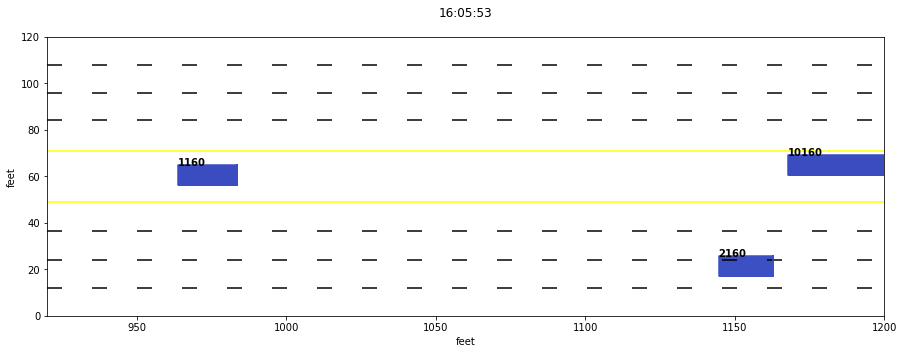

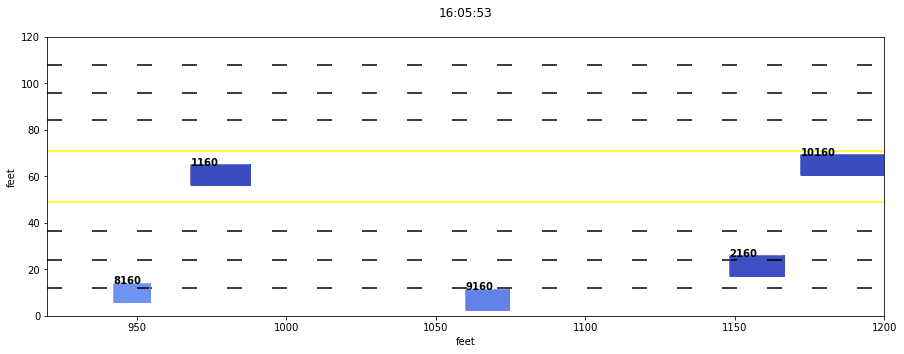

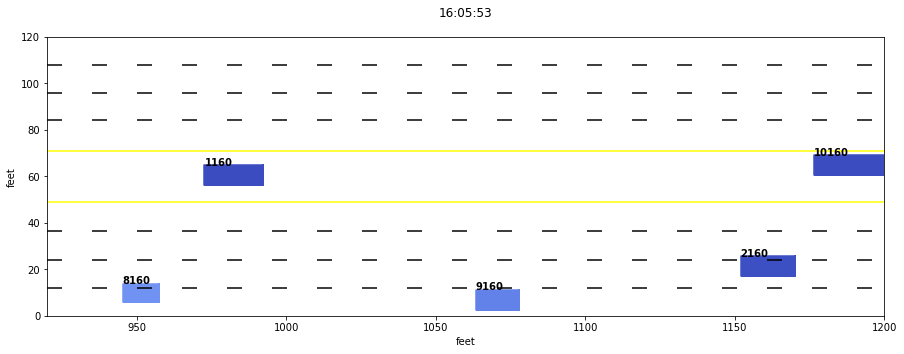

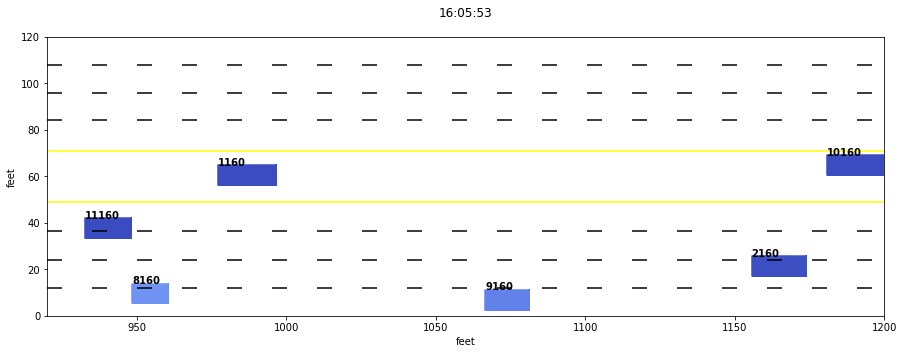

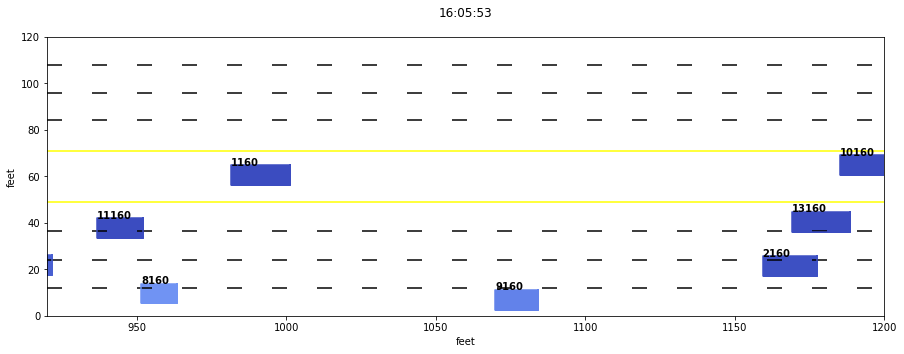

...

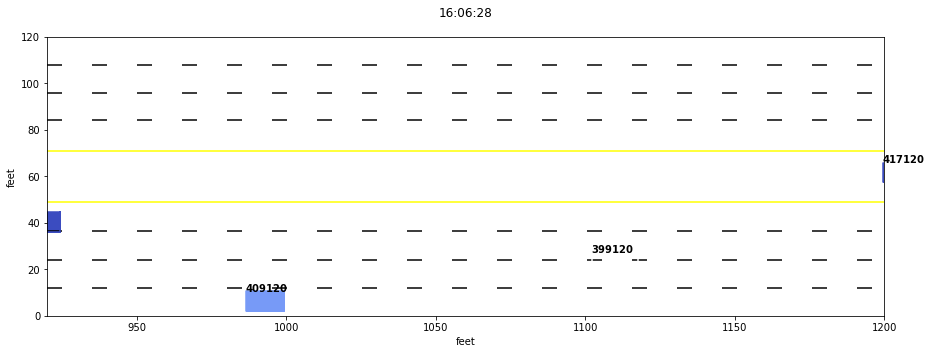

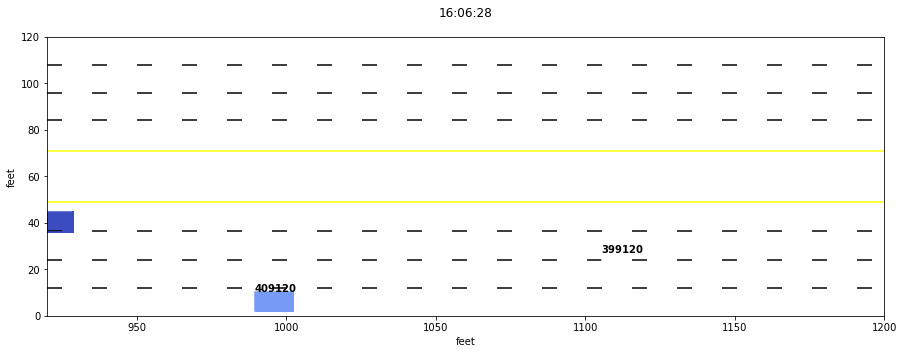

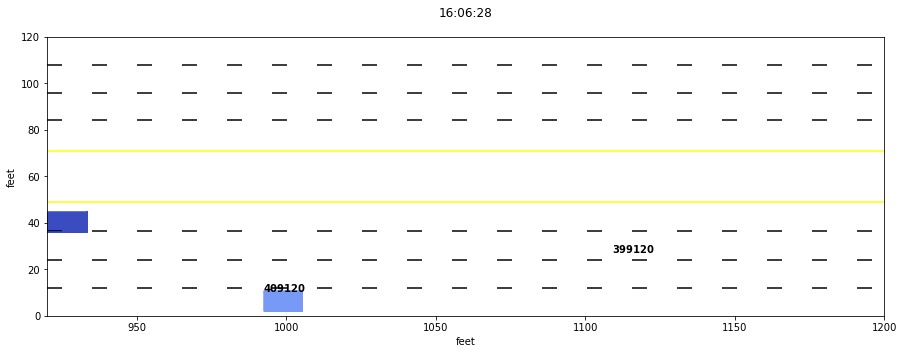

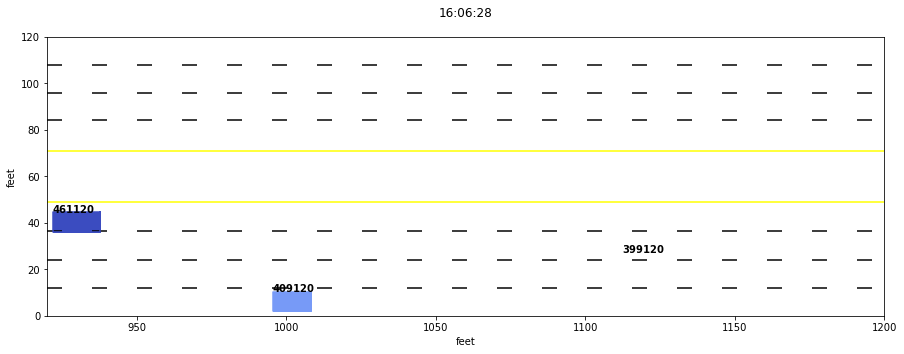

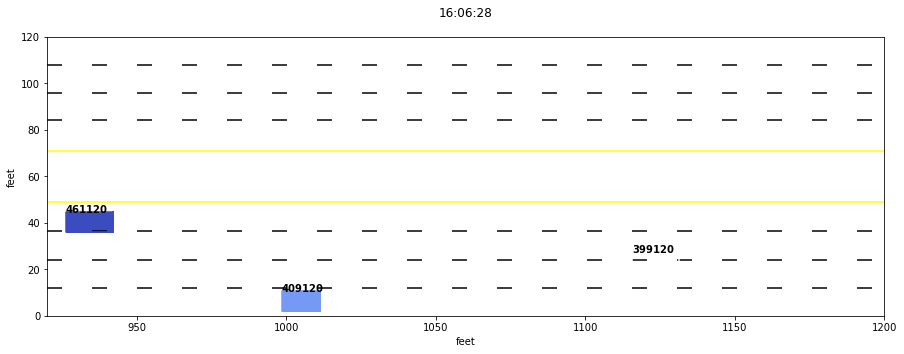

Error in callback <function flush_figures at 0x00000208BCDB4310> (for post_execute):


KeyboardInterrupt: 

In [7]:
# Divide all the data into frame numbers(1 ~ 2000). Then save each frame snapshot as a .jpg file 
# within a separate folder to later create an animation.

# img = plt.imread('../images/highway_360ft.jpg')
maxFrameNum = int(max(df['Frame #']))    # Find the maximum number of frame
cameraNum = 6
xmin, xmax = animation_utils.findMinMax(cameraNum)
ymax = 120
aspectRatio = (xmax-xmin) / (3 * ymax)
timeStamp = ''

for i in range(maxFrameNum):
    # Plot dimension setup
    fig, ax = plt.subplots(figsize=(15,10))
    #ax.imshow(img, extent=[xmin,xmax,0,ymax])
    ax.set_aspect(aspectRatio)
    plt.xlim(xmin, xmax)
    plt.ylim(0, ymax)
    plt.xlabel('feet')
    plt.ylabel('feet')
    
    # Lane drawing only for development mode
    plt.axhline(108, c = 'black', ls='dashed', dashes=(10,20))
    plt.axhline(96, c = 'black', ls='dashed', dashes=(10,20))
    plt.axhline(84, c = 'black', ls='dashed', dashes=(10,20))
    plt.axhline(71, c = 'yellow', ls='solid')
    plt.axhline(49, c = 'yellow', ls='solid')
    plt.axhline(36.5, c = 'black', ls='dashed', dashes=(10,20))
    plt.axhline(24, c = 'black', ls='dashed', dashes=(10,20))
    plt.axhline(12, c = 'black', ls='dashed', dashes=(10,20))
    
    plt.figure(i+1)
    
    # extract the ID & road coordinates of the bottom 4 points of all vehicles at frame # i
    frameSnap = df.loc[(df['Frame #'] == i)]
    frameSnap = np.array(frameSnap[['tr_x','tr_y','tl_x','tl_y','bl_x','bl_y','br_x','br_y',
                                    'ID','direction','Timestamp', 'speed']])
    animation_utils.coordToFt(frameSnap)
    
    # Looping thru every car in the frame
    for j in range(len(frameSnap)):  
        carID = frameSnap[j,8]
        carSpeed = frameSnap[j,11] 
        coord = frameSnap[j,0:8]     # Road Coordinates of the Car
        coord = np.reshape(coord,(-1,2)).tolist()
        coord.append(coord[0])
        xs, ys = zip(*coord)
        
        xcoord = frameSnap[j,2]
        ycoord = frameSnap[j,3]

        # Displaying information above the car
        
        if xcoord < xmax and xcoord > xmin and ycoord < ymax :
            # Production Mode
                # plt.text(xcoord, ycoord, str(int(carSpeed * 2.2369)) + ' mph', weight='bold')
            # Development Mode
            if(not(math.isnan(carID))) :
                plt.text(xcoord, ycoord, int(carID), weight='bold')
            
        oneCarColor = animation_utils.getCarColor(carSpeed, carID)
            
        # Plotting the car
        newxs = animation_utils.fillBetweenX(xs)
        newys = animation_utils.fillBetweenY(ys)
        ax.plot(newxs, newys, c = oneCarColor)
        ax.fill(newxs, newys, c = oneCarColor)
        
    # If there are cars in this frame, update timeStamp. If not, timeStamp from previous cycle
    # will be used
    if(len(frameSnap) != 0 and not(math.isnan(frameSnap[0,10]))) :
        timeStamp = datetime.fromtimestamp(frameSnap[0,10]).strftime("%H:%M:%S")
        
    plt.title(timeStamp, pad=20)
    # add when creating for presentation-> , dpi=100
    plt.savefig('../p1c6/' + format(i,"04d") + '.jpg')

In [8]:
# Fetch image files from the folder, and create an animation.

image_folder = '../p1c6'
video_name = 'p1c6_animation.mp4'

images = [img for img in os.listdir(image_folder) if img.endswith(".jpg")]
images.sort()

frame = cv2.imread(os.path.join(image_folder, images[1]))
height, width, layers = frame.shape
video = cv2.VideoWriter(video_name, 0, 10, (width,height))

for image in images:
    video.write(cv2.imread(os.path.join(image_folder, image)))
    
cv2.destroyAllWindows()
video.release()